In [45]:
from tensorflow import keras
import tensorflow as tf
from keras.applications import VGG16
from keras.layers import Dense,Dropout,Activation,Add,MaxPooling2D,Conv2D,Flatten,BatchNormalization
from keras.models import Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import save_model
import numpy as np
import matplotlib.pyplot as plt

In [2]:
import os
for dirname, _, filenames in os.walk('../Complete/extended_dataset/'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

../Complete/extended_dataset/test\Plain\1.jpg
../Complete/extended_dataset/test\Plain\2.jpg
../Complete/extended_dataset/test\Plain\20220819_17_37_57_391_000_Cmsqzc7LqxQcQY8E1p19jKxJPG42_F_3000_4000.jpg
../Complete/extended_dataset/test\Plain\3.jpg
../Complete/extended_dataset/test\Plain\4.jpg
../Complete/extended_dataset/test\Plain\5.jpg
../Complete/extended_dataset/test\Plain\6.jpg
../Complete/extended_dataset/test\Plain\7.jpg
../Complete/extended_dataset/test\Plain\8.jpg
../Complete/extended_dataset/test\Plain\9.jpg
../Complete/extended_dataset/test\Plain\rubber-speed-breaker.jpg
../Complete/extended_dataset/test\Pothole\1.jpg
../Complete/extended_dataset/test\Pothole\2.jpg
../Complete/extended_dataset/test\Pothole\20220819_15_18_40_082_000_hnEYwZk1I5RsPJ0KVT40Wir0BSh1_F_4160_3120.jpg
../Complete/extended_dataset/test\Pothole\20220819_15_21_22_497_000_hnEYwZk1I5RsPJ0KVT40Wir0BSh1_F_4160_3120 (1).jpg
../Complete/extended_dataset/test\Pothole\20220819_15_23_17_453_000_hnEYwZk1I5RsPJ0K

In [3]:
train_datagen = ImageDataGenerator(rescale=1/255,
                                   shear_range = 0.2,
                                   zoom_range = 0.2,
                                   vertical_flip =  True ,
                                   rotation_range=40,
                                   brightness_range = (0.5, 1.5),
                                   horizontal_flip = True,preprocessing_function=tf.keras.applications.vgg16.preprocess_input)


#train data with 224*224*3 size

train_data = train_datagen.flow_from_directory('../Complete/extended_dataset/train',
                                                 target_size = (224, 224),
                                                 class_mode='binary',
                                                 shuffle=True,seed=1)

validate_data = train_datagen.flow_from_directory('../Complete/extended_dataset/validate',
                                                 target_size = (224, 224),
                                                 class_mode='binary',
                                                 shuffle=True,seed=1)


Found 918 images belonging to 2 classes.
Found 100 images belonging to 2 classes.


In [4]:
test_datagen = ImageDataGenerator(rescale = 1/255,preprocessing_function=tf.keras.applications.vgg16.preprocess_input)
test_data = test_datagen.flow_from_directory("../Complete/extended_dataset/test",
                                                           batch_size=32,
                                                           target_size=(224,224),
                                                           class_mode='binary',
                                                           shuffle=True,seed=1)

Found 41 images belonging to 2 classes.


In [5]:
class_names = ["plain","pothole"]
for i in range(len(class_names)):
    print(i," ",class_names[i])

0   plain
1   pothole


### CNN Model

In [6]:
model_cnn = Sequential()

model_cnn.add(Conv2D(128, (3,3), activation='relu', input_shape=(224, 224, 3)))
model_cnn.add(MaxPooling2D((2,2)))

model_cnn.add(Conv2D(64, (3,3), activation='relu'))
model_cnn.add(MaxPooling2D((2,2)))

model_cnn.add(Conv2D(64, (3,3), activation='relu'))
model_cnn.add(MaxPooling2D((2,2)))

model_cnn.add(Flatten())

model_cnn.add(Dense(128, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.002)))
model_cnn.add(Dropout(0.5))

model_cnn.add(Dense(64, activation='relu'))
model_cnn.add(Dropout(0.4))

model_cnn.add(Dense(2, activation='softmax'))

# Compile the model
model_cnn.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Add Early Stopping
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)


C:\Users\Admin\miniconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [7]:
model_cnn.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 222, 222, 128)       │           3,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 111, 111, 128)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 109, 109, 64)        │          73,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 52, 52, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 26, 26, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 43264)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │       5,537,920 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 2)                   │             130 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,660,610 (21.59 MB)

 Trainable params: 5,660,610 (21.59 MB)

 Non-trainable params: 0 (0.00 B)

In [11]:
history_cnn=model_cnn.fit(train_data,
    validation_data = test_data,
    callbacks=[early_stopping],
    epochs = 25)

Epoch 1/25
29/29 ━━━━━━━━━━━━━━━━━━━━ 63s 2s/step - accuracy: 0.8545 - loss: 0.4371 - val_accuracy: 0.8780 - val_loss: 0.4346
Epoch 2/25
29/29 ━━━━━━━━━━━━━━━━━━━━ 59s 2s/step - accuracy: 0.8630 - loss: 0.3982 - val_accuracy: 0.9024 - val_loss: 0.3808
Epoch 3/25
29/29 ━━━━━━━━━━━━━━━━━━━━ 61s 2s/step - accuracy: 0.8594 - loss: 0.4026 - val_accuracy: 0.8293 - val_loss: 0.4146
Epoch 4/25
29/29 ━━━━━━━━━━━━━━━━━━━━ 60s 2s/step - accuracy: 0.8309 - loss: 0.4582 - val_accuracy: 0.8049 - val_loss: 0.4210
Epoch 5/25
29/29 ━━━━━━━━━━━━━━━━━━━━ 61s 2s/step - accuracy: 0.8847 - loss: 0.3560 - val_accuracy: 0.8780 - val_loss: 0.3139
Epoch 6/25
29/29 ━━━━━━━━━━━━━━━━━━━━ 255s 9s/step - accuracy: 0.8463 - loss: 0.4338 - val_accuracy: 0.8049 - val_loss: 0.4259
Epoch 7/25
29/29 ━━━━━━━━━━━━━━━━━━━━ 66s 2s/step - accuracy: 0.8690 - loss: 0.4005 - val_accuracy: 0.8293 - val_loss: 0.4001
Epoch 8/25
29/29 ━━━━━━━━━━━━━━━━━━━━ 61s 2s/step - accuracy: 0.8646 - loss: 0.3950 - val_accuracy: 0.8780 - val_loss

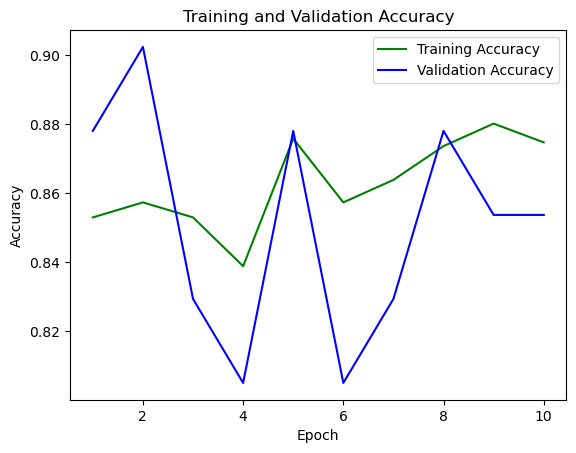

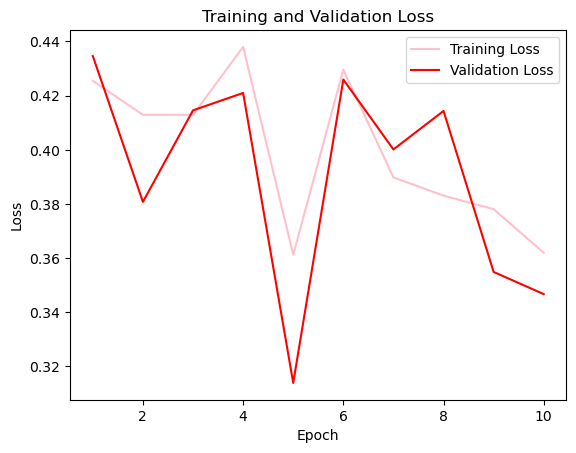

In [12]:
acc = history_cnn.history['accuracy']
val_acc = history_cnn.history['val_accuracy']
loss = history_cnn.history['loss']
val_loss = history_cnn.history['val_loss']
epochs = range(1, len(loss) + 1)

#accuracy plot
plt.plot(epochs, acc, color='green', label='Training Accuracy')
plt.plot(epochs, val_acc, color='blue', label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend()

plt.figure()
#loss plot
plt.plot(epochs, loss, color='pink', label='Training Loss')
plt.plot(epochs, val_loss, color='red', label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.show()

### VGG16 Model

In [13]:
vgg_model =  VGG16(input_shape=(224,224,3),include_top=True , weights='imagenet')

for models in vgg_model.layers[-4:]:
  models.trainable= True

vgg_model = keras.Model(inputs=vgg_model.input, outputs=vgg_model.layers[-2].output)
model = keras.Sequential()

for layer in vgg_model.layers:
  model.add(layer)
model.add(Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001)))
model.add(Dropout(0.3))
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(2, activation='softmax'))

In [68]:
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ block1_conv1 (Conv2D)                │ (None, 224, 224, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 224, 224, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 112, 112, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 28, 28, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 28, 28, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 14, 14, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 7, 7, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ fc1 (Dense)                          │ (None, 4096)                │     102,764,544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ fc2 (Dense)                          │ (None, 4096)                │      16,781,312 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 406,027,592 (1.51 GB)

 Trainable params: 135,342,530 (516.29 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 270,685,062 (1.01 GB)

In [14]:
from tensorflow.keras.optimizers import Adam
model.compile(optimizer=Adam(learning_rate=1e-5), loss=keras.losses.SparseCategoricalCrossentropy(), metrics=['accuracy'])

#early stopping function
early = tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=5)

In [15]:
from tensorflow.keras.callbacks import ReduceLROnPlateau

# Define the ReduceLROnPlateau callback
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-7, verbose=1)

In [16]:
history=model.fit(train_data,
    validation_data = validate_data,
    callbacks=[early, reduce_lr],
    epochs = 13)

Epoch 1/13
29/29 ━━━━━━━━━━━━━━━━━━━━ 1122s 39s/step - accuracy: 0.6479 - loss: 1.1107 - val_accuracy: 0.9400 - val_loss: 0.6540 - learning_rate: 1.0000e-05
Epoch 2/13
29/29 ━━━━━━━━━━━━━━━━━━━━ 1237s 43s/step - accuracy: 0.9395 - loss: 0.6320 - val_accuracy: 0.9200 - val_loss: 0.7017 - learning_rate: 1.0000e-05
Epoch 3/13
29/29 ━━━━━━━━━━━━━━━━━━━━ 1115s 38s/step - accuracy: 0.9253 - loss: 0.6565 - val_accuracy: 0.9600 - val_loss: 0.5869 - learning_rate: 1.0000e-05
Epoch 4/13
29/29 ━━━━━━━━━━━━━━━━━━━━ 973s 33s/step - accuracy: 0.9550 - loss: 0.5986 - val_accuracy: 0.9600 - val_loss: 0.5437 - learning_rate: 1.0000e-05
Epoch 5/13
29/29 ━━━━━━━━━━━━━━━━━━━━ 1256s 43s/step - accuracy: 0.9629 - loss: 0.5507 - val_accuracy: 0.9500 - val_loss: 0.5389 - learning_rate: 1.0000e-05
Epoch 6/13
29/29 ━━━━━━━━━━━━━━━━━━━━ 1218s 42s/step - accuracy: 0.9847 - loss: 0.5182 - val_accuracy: 0.9600 - val_loss: 0.5080 - learning_rate: 1.0000e-05
Epoch 7/13
29/29 ━━━━━━━━━━━━━━━━━━━━ 1892s 66s/step - accu

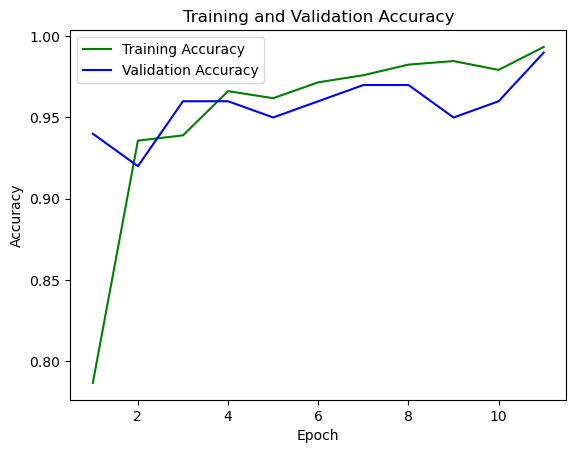

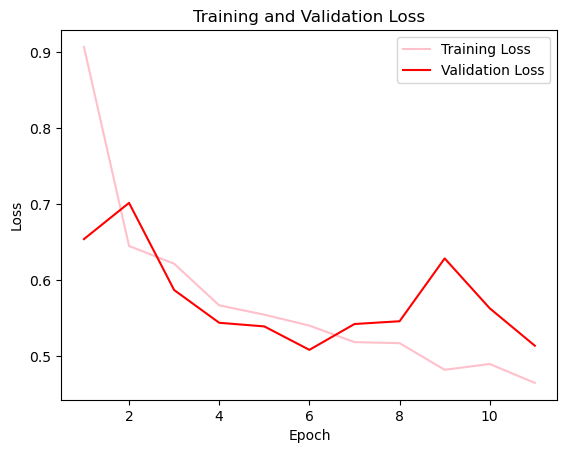

In [17]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)

#accuracy plot
plt.plot(epochs, acc, color='green', label='Training Accuracy')
plt.plot(epochs, val_acc, color='blue', label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend()

plt.figure()
#loss plot
plt.plot(epochs, loss, color='pink', label='Training Loss')
plt.plot(epochs, val_loss, color='red', label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.show()

In [18]:
model.save('vgg16_custom_model.h5')

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 908ms/step
[1]
pothole


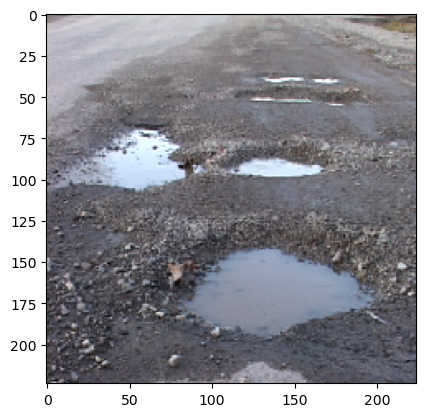

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step
[1]
pothole


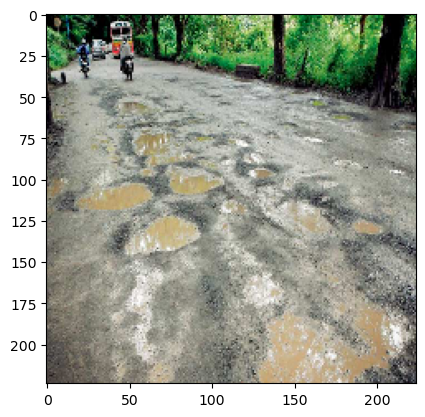

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step
[1]
pothole


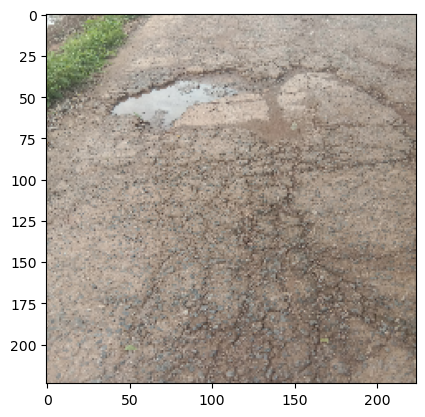

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step
[1]
pothole


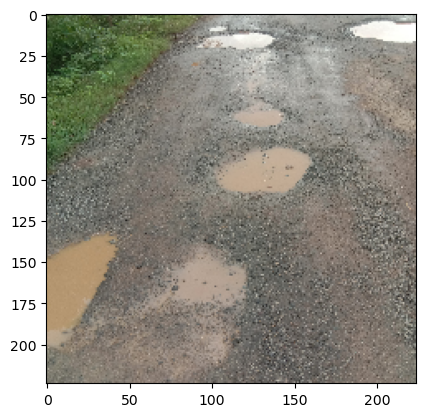

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step
[1]
pothole


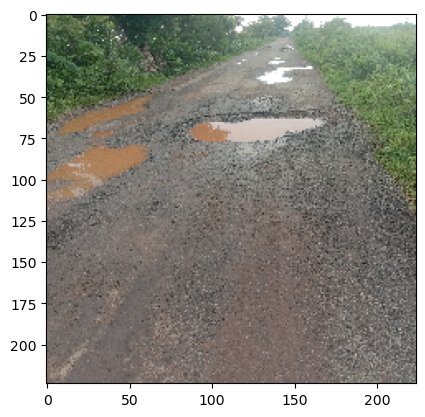

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step
[1]
pothole


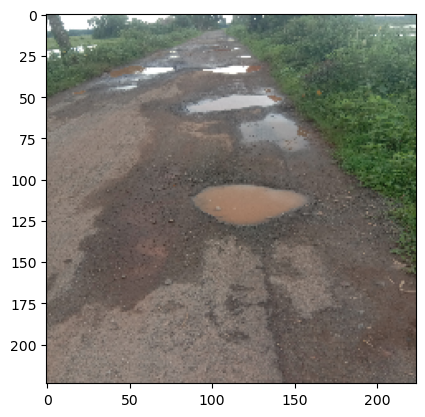

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step
[1]
pothole


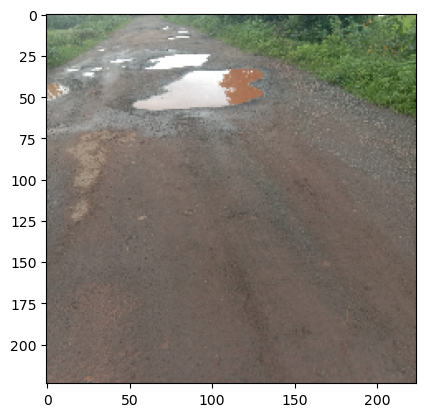

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step
[1]
pothole


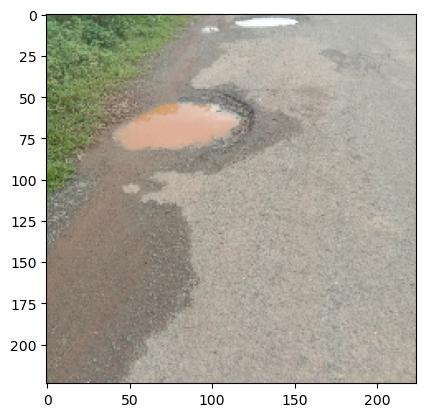

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step
[1]
pothole


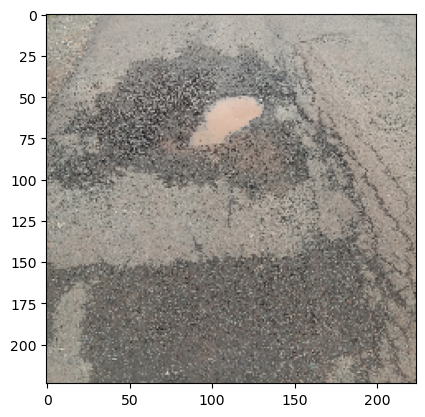

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step
[1]
pothole


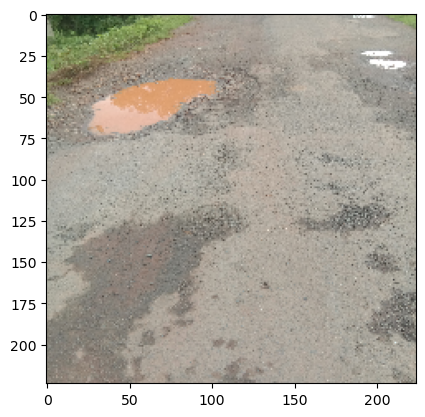

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step
[1]
pothole


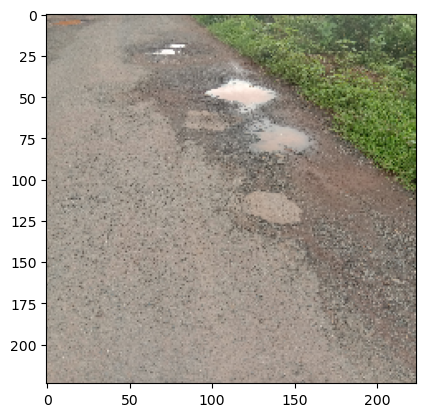

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step
[1]
pothole


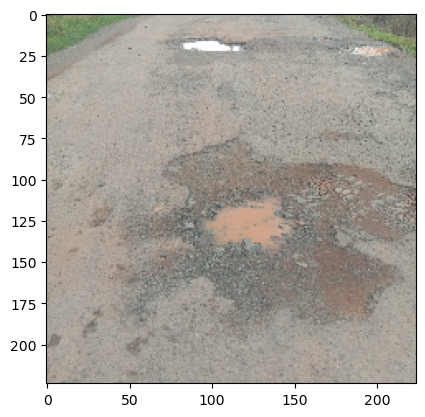

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step
[1]
pothole


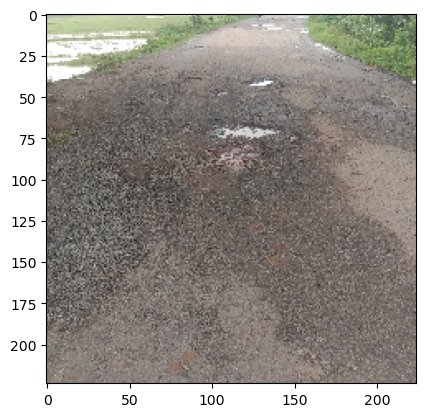

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step
[1]
pothole


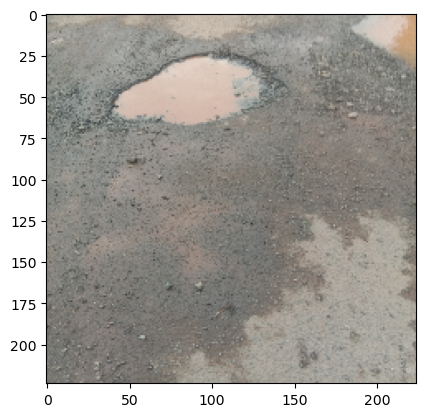

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step
[1]
pothole


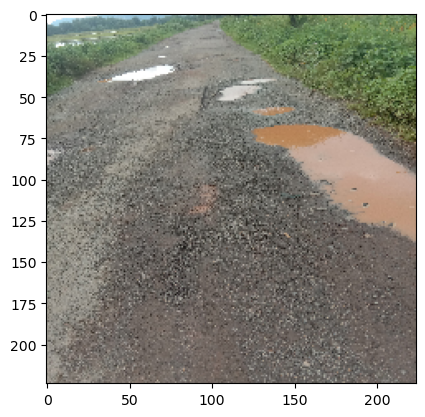

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step
[1]
pothole


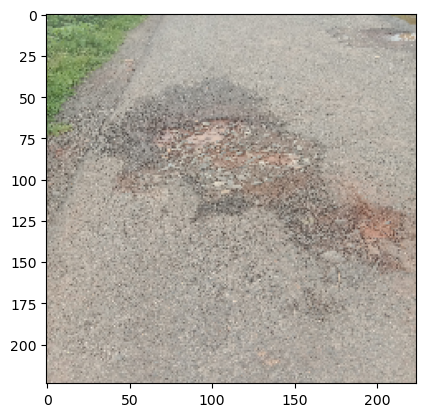

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step
[1]
pothole


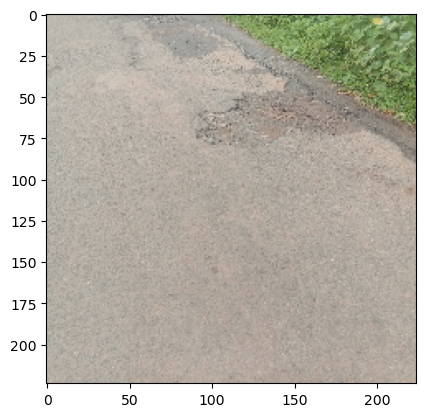

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step
[1]
pothole


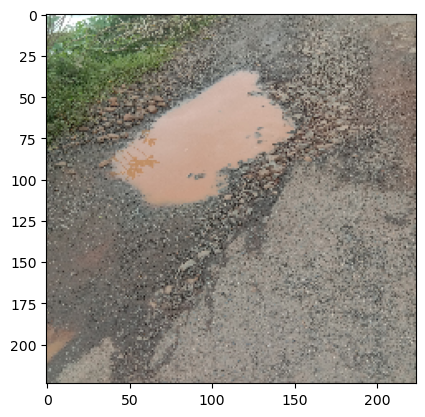

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step
[1]
pothole


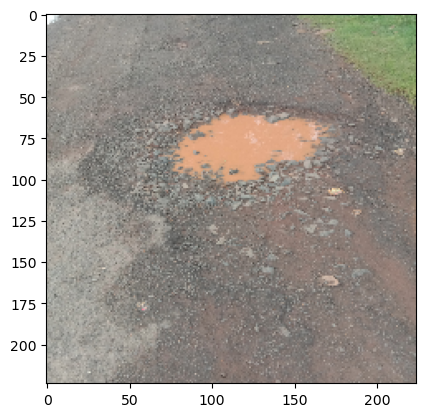

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step
[1]
pothole


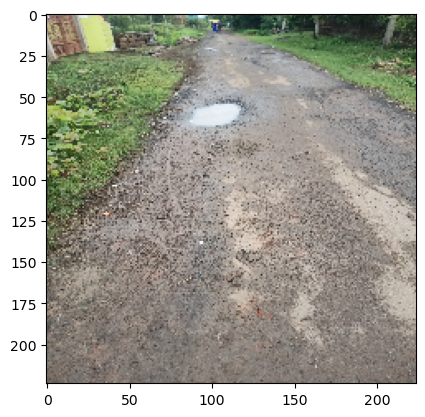

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step
[1]
pothole


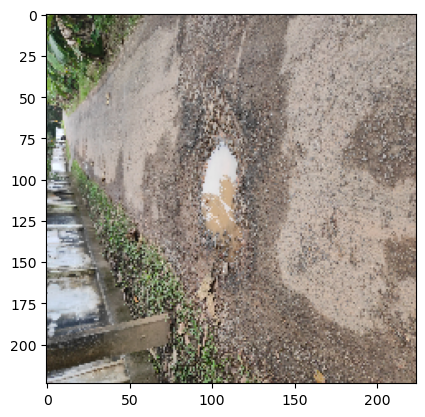

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step
[0]
plain


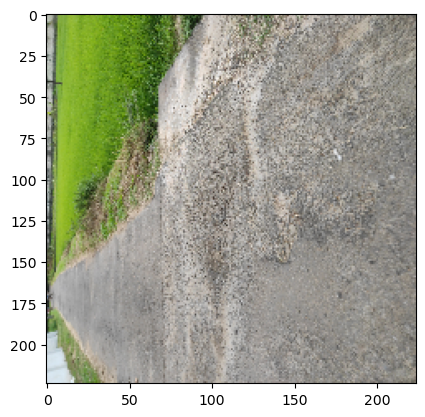

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step
[1]
pothole


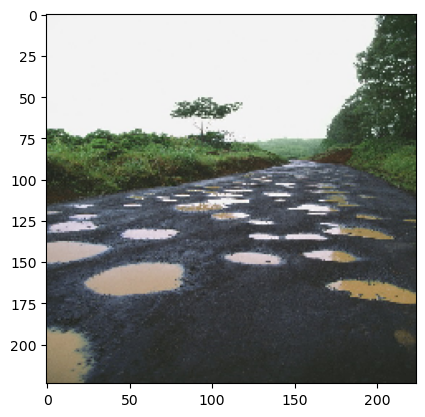

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step
[0]
plain


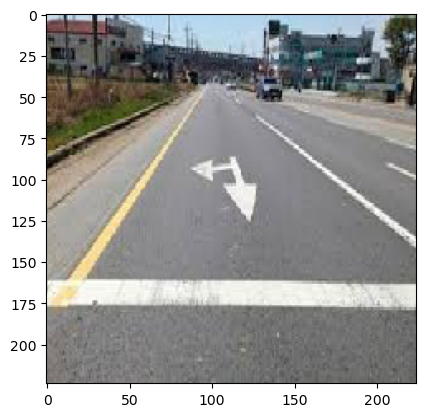

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step
[1]
pothole


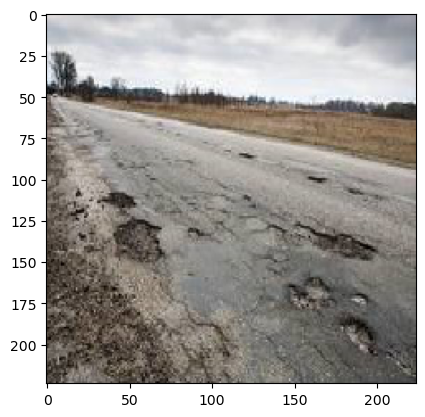

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step
[1]
pothole


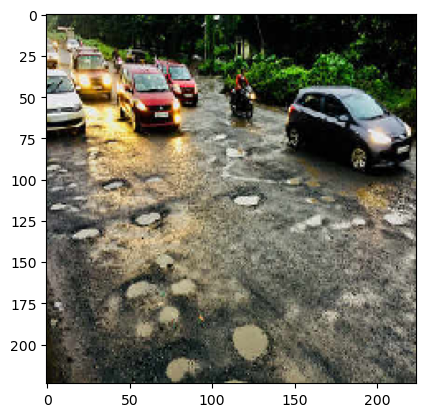

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step
[0]
plain


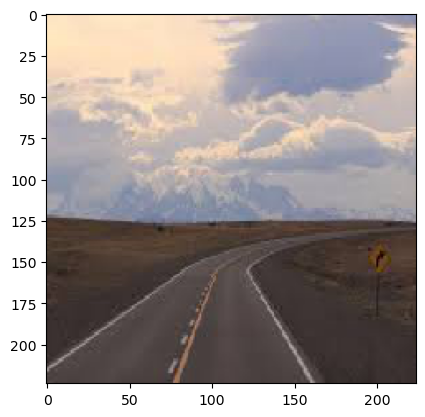

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step
[0]
plain


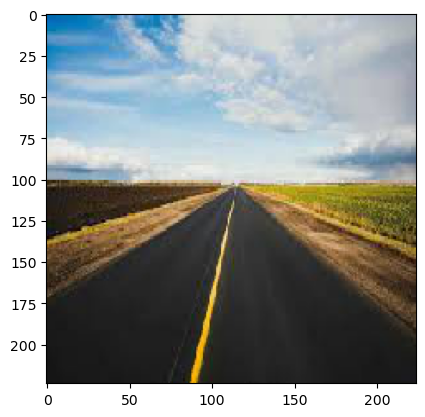

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step
[1]
pothole


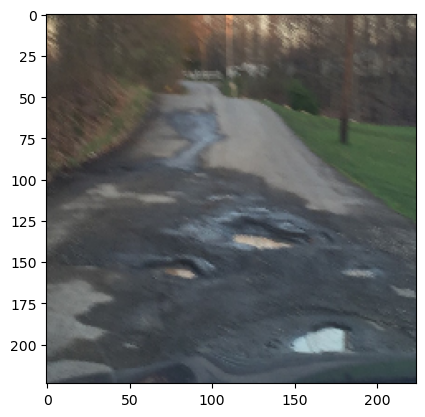

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step
[1]
pothole


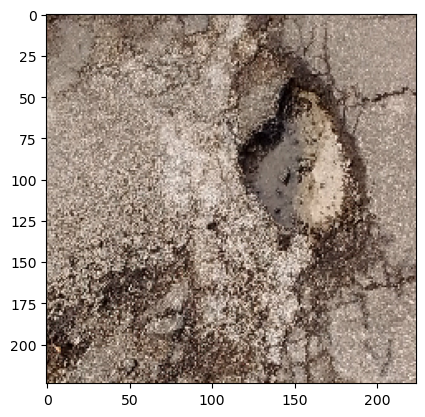

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step
[0]
plain


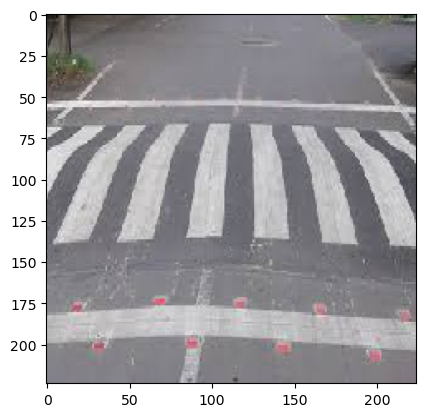

In [35]:
from tensorflow.keras.models import load_model
def pred(image_folder):
    loaded_model = load_model('../Complete/vgg16_custom_model.h5')
    for filename in os.listdir(image_folder):
        img_path = os.path.join(image_folder, filename)  # Construct the full path to the image
        new_img = image.load_img(img_path, target_size=(224, 224))  # Load the image
        img = image.img_to_array(new_img)  # Convert the image to an array
        img = np.expand_dims(img, axis=0)  # Expand dimensions to match the model input
        
        img = preprocess_input(img)
        
        prediction = loaded_model.predict(img)  # Make the prediction
        
        prediction = np.argmax(prediction, axis=1)  # Get the index of the highest probability
        print(prediction)
        print(class_names[prediction[0]])  # Print the corresponding class name
        plt.imshow(new_img)  # Display the image
        plt.show() 
pred("../Complete/test2/")

In [40]:
import boto3
from io import BytesIO
from PIL import Image

def load_all_images_from_s3(bucket_name):

    s3 = boto3.client(
        's3',
        aws_access_key_id ='access_key',
        aws_secret_access_key = 'secret_key',
        region_name = 'ap-south-1'
    )


    try:
        response = s3.list_objects_v2(Bucket=bucket_name)

        # filter and load image
        images = []
        for obj in response.get('Contents', []):
            key = obj['Key']
            if key.endswith(('.jpg', '.jpeg', '.png', '.gif', '.bmp', '.tiff')):
                
                image_stream = BytesIO()
                s3.download_fileobj(bucket_name, key, image_stream)
                image_stream.seek(0)
                image = Image.open(image_stream)
                images.append(image)

        return images
    except Exception as e:
        print(f"Error occurred: {e}")
        return []


bucket_name = 'imageuploadsuyog'
images = load_all_images_from_s3(bucket_name)

print(f"loaded {len(images)} images from the S3 bucket.")

loaded 3 images from the S3 bucket.


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step
Predictions for image 0: [1]
pothole


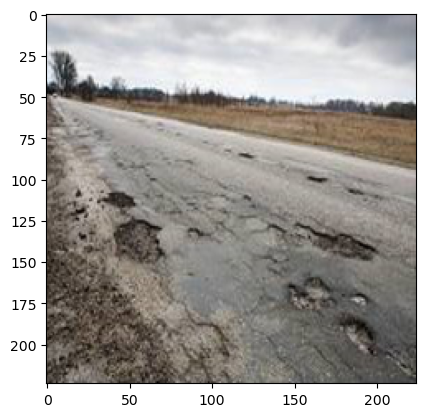

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step
Predictions for image 1: [1]
pothole


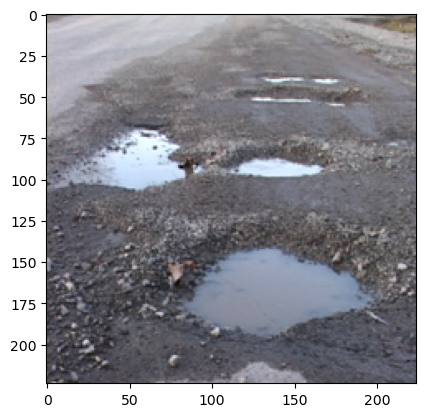

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step
Predictions for image 2: [0]
plain


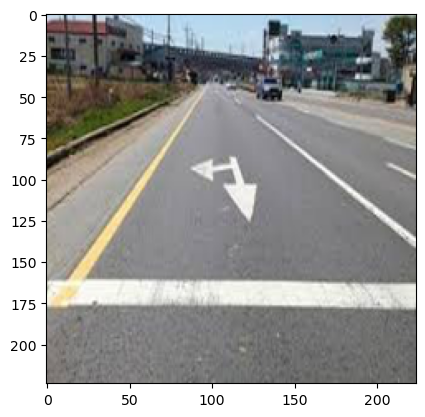

In [58]:
for i, image in enumerate(images):
    target_size=(224, 224)
    image = image.resize(target_size)
    image_array = img_to_array(image)
    image_array = np.expand_dims(image_array, axis=0)
    image_array = preprocess_input(image_array)
    prediction = loaded_model.predict(image_array)
    prediction = np.argmax(prediction, axis=1)
    print(f"Predictions for image {i}: {prediction}")
    print(class_names[prediction[0]])
    plt.imshow(image) 
    plt.show() 